<a href="https://colab.research.google.com/github/djbradyAtOpticalSciencesArizona/computationalImaging/blob/master/sampling/focalStacking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Focal Stacking

## David Brady
## University of Arizona
## Spring 2023

In [2]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from google.colab import files
from google.colab import drive
from scipy.interpolate import interp1d
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams.update({'font.size': 22})
plt.rcParams['lines.linewidth'] = 3

This notebook demonstrates generation of an "all in focus" image from a focal stack. The method used evaluates the local gradient of each image and then chooses pixel data from the image with the largest gradient. 

To start, one needs to align the images, which involves 


1.   Finding key points and descriptors, using for example the SIFT method.
2.   Matching key points and computing the homography that relates images in the stack
3. warping images to match a common frame
4. taking the laplacian to find the focal regions (with some blur to spread the focal regions)
5. creating the integrated estimated image



## load images

In [1]:
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/back.png'
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/front.png'
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/middle.png'

--2023-02-13 17:39:49--  https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/back.png
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/back.png [following]
--2023-02-13 17:39:49--  https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/back.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 17258090 (16M) [application/octet-stream]
Saving to: ‘back.png’

back.png            100%[===================>]  16.46M  --.-KB/s    in 0.1s    

2023-02-13 17

In [6]:
images=[]
for filename in os.listdir('.'):
  img = cv2.imread(filename, cv2.COLOR_BGR2RGB )
  if img is not None:
    images.append(img)

Text(0.5, 0, 'front field focus')

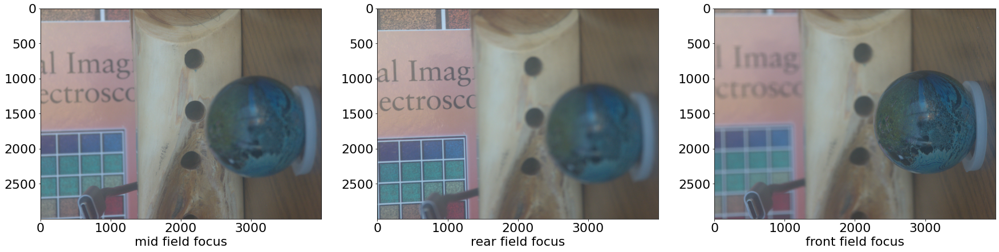

In [35]:
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.imshow(np.flip(images[0],axis=-1))
plt.xlabel('mid field focus')
plt.subplot(1,3,2)
plt.imshow(np.flip(images[1],axis=-1))
plt.xlabel('rear field focus')
plt.subplot(1,3,3)
plt.imshow(np.flip(images[2],axis=-1))
plt.xlabel('front field focus')

## Find key points

OpenCV includes multiple methods for finding key points, including

Scale invariant feature transforms
https://en.wikipedia.org/wiki/Scale-invariant_feature_transform
Oriented FAST and rotated Brief
https://medium.com/analytics-vidhya/understanding-keypoints-and-orb-algorithm-f260e6fb640c
Speeded up robust features
https://en.wikipedia.org/wiki/Speeded_up_robust_features#:~:text=In%20computer%20vision%2C%20speeded%20up,feature%20transform%20(SIFT)%20descriptor.

Here we use SIFT to find features and match features

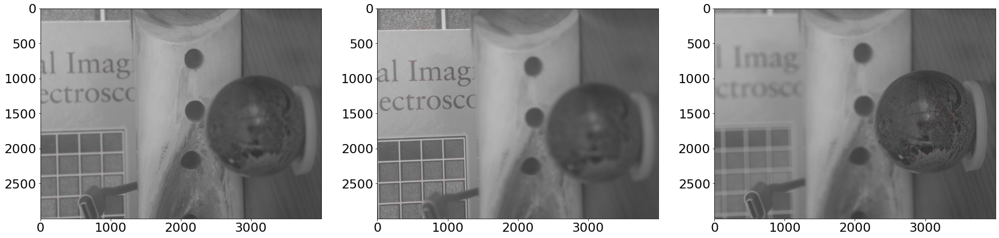

(<matplotlib.image.AxesImage at 0x7fac8ed04a90>, None)

In [57]:
plt.figure(figsize=(30,10))
SIFT = cv2.SIFT_create()
# foreground
grayImage0=cv2.cvtColor(images[0], cv2.COLOR_BGR2GRAY)
kp0, des0 = SIFT.detectAndCompute(grayImage0,None)
# draw only keypoints location,not size and orientation
img0 = cv2.drawKeypoints(grayImage0, kp0, None, color=(255,0,0), flags=0)
plt.subplot(1,3,1)
plt.imshow(img0)
# Background
grayImage1=cv2.cvtColor(images[1], cv2.COLOR_BGR2GRAY)
kp1, des1 = SIFT.detectAndCompute(grayImage1,None)
# draw only keypoints location,not size and orientation
img1 = cv2.drawKeypoints(grayImage1, kp1, None, color=(255,0,0), flags=0)
plt.subplot(1,3,2)
plt.imshow(img1)
# Middle ground
grayImage2=cv2.cvtColor(images[2], cv2.COLOR_BGR2GRAY)
kp2, des2 = SIFT.detectAndCompute(grayImage2,None)
# draw only keypoints location,not size and orientation
img2 = cv2.drawKeypoints(grayImage2, kp2, None, color=(255,0,0))
plt.subplot(1,3,3)
plt.imshow(img2), plt.show()

# match key points

# foreground to middle ground

In [97]:
matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
# This returns the top two matches for each feature point (list of list)
pair_matches = matcher.knnMatch(des2, des0, 2)
raw_matches = []
for m, n in pair_matches:
  if m.distance < 0.6 * n.distance:
    raw_matches.append([m])

In [83]:
len(raw_matches)

21

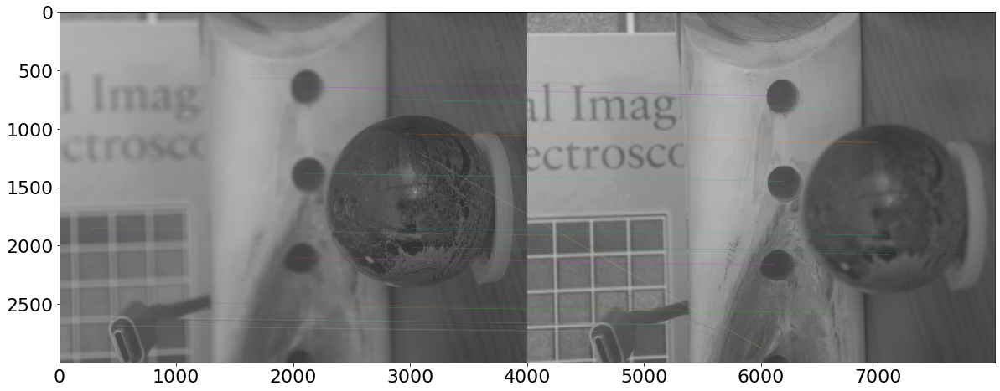

(<matplotlib.image.AxesImage at 0x7fac787b5820>, None)

In [98]:
# cv2.drawMatchesKnn expects list of lists as matches.
img3 = cv2.drawMatchesKnn(grayImage2,kp2,grayImage0,kp0,raw_matches,None,  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3),plt.show()

## Determine homography

A homography is a linear transformation of points from one image perspective to another

In [99]:
numMatches=len(raw_matches)
# Define 2x2 empty matrices
p1 = np.zeros((numMatches, 2))
p2 = np.zeros((numMatches, 2))
 
# Storing values to the matrices
for i in range(len(raw_matches)):
    p1[i, :] = kp2[raw_matches[i][0].queryIdx].pt
    p2[i, :] = kp0[raw_matches[i][0].trainIdx].pt
 
# Find the homography matrix.
homographyFG, mask = cv2.findHomography(p1, p2, cv2.RANSAC)


In [86]:
homographyFG

array([[ 9.85592629e-01,  9.14086221e-03,  9.43298730e+01],
       [-9.29069175e-04,  9.90992934e-01,  8.73748499e+01],
       [ 1.44793477e-07,  1.99969897e-06,  1.00000000e+00]])

In [100]:
warpImageFG=cv2.warpPerspective(grayImage2,homographyFG,(4000,3000))

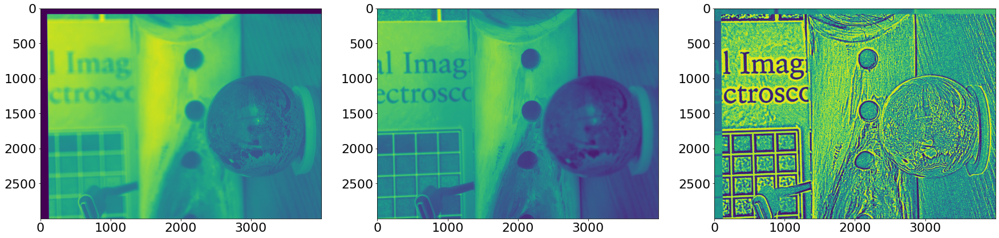

In [101]:
plt.figure(figsize=(30,15))
plt.subplot(1,3,1)
plt.imshow(warpImageFG)
plt.subplot(1,3,2)
plt.imshow(grayImage0)
plt.subplot(1,3,3)
plt.imshow(warpImageFG-grayImage0)

# background  to middle ground

In [102]:
matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
# This returns the top two matches for each feature point (list of list)
pair_matches = matcher.knnMatch(des1, des0, 2)
raw_matches = []
for m, n in pair_matches:
  if m.distance < 0.6 * n.distance:
    raw_matches.append([m])

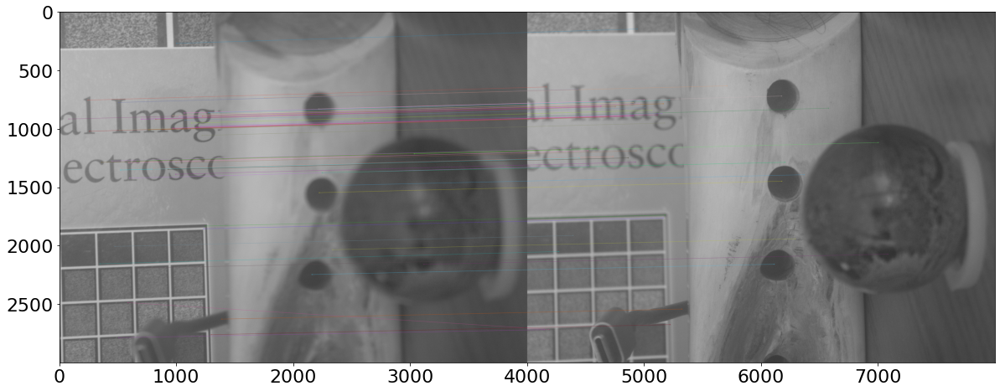

(<matplotlib.image.AxesImage at 0x7fac800d1340>, None)

In [103]:
# cv2.drawMatchesKnn expects list of lists as matches.
img3 = cv2.drawMatchesKnn(grayImage1,kp1,grayImage0,kp0,raw_matches,None,  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3),plt.show()

## Determine homography

In [104]:
numMatches=len(raw_matches)
# Define 2x2 empty matrices
p1 = np.zeros((numMatches, 2))
p2 = np.zeros((numMatches, 2))
 
# Storing values to the matrices
for i in range(len(raw_matches)):
    p1[i, :] = kp1[raw_matches[i][0].queryIdx].pt
    p2[i, :] = kp0[raw_matches[i][0].trainIdx].pt
 
# Find the homography matrix.
homographyBG, mask = cv2.findHomography(p1, p2, cv2.RANSAC)


In [93]:
homographyBG

array([[ 1.02200325e+00, -5.40158754e-03, -8.10914063e+01],
       [ 5.90087693e-03,  1.00966003e+00, -1.22938306e+02],
       [ 1.65008906e-06, -1.39886619e-06,  1.00000000e+00]])

In [105]:
warpImageBG=cv2.warpPerspective(grayImage1,homographyBG,(4000,3000))

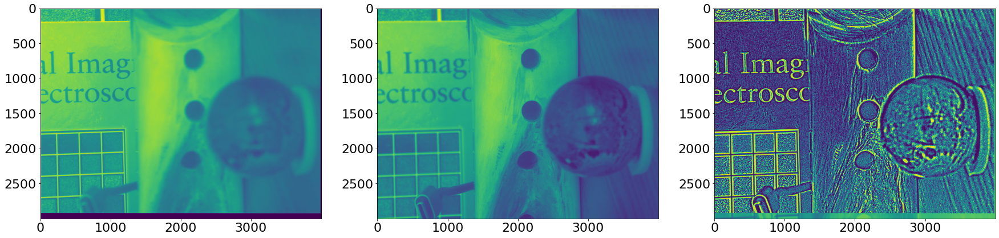

In [106]:
plt.figure(figsize=(30,15))
plt.subplot(1,3,1)
plt.imshow(warpImageBG)
plt.subplot(1,3,2)
plt.imshow(grayImage0)
plt.subplot(1,3,3)
plt.imshow(warpImageBG-grayImage0)

## View Aligned images

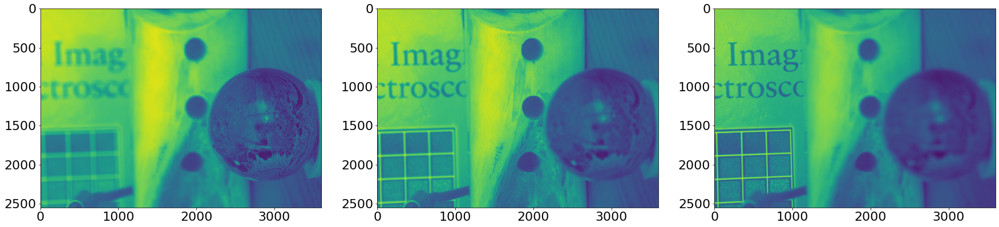

In [108]:
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.imshow(warpImageFG[200:2750,200:3800])
plt.subplot(1,3,2)
plt.imshow(grayImage0[200:2750,200:3800])
plt.subplot(1,3,3)
plt.imshow(warpImageBG[200:2750,200:3800])

## Select infocus regions

we blur the images before and after taking the gradient to extend the region of focus away from edge features. 

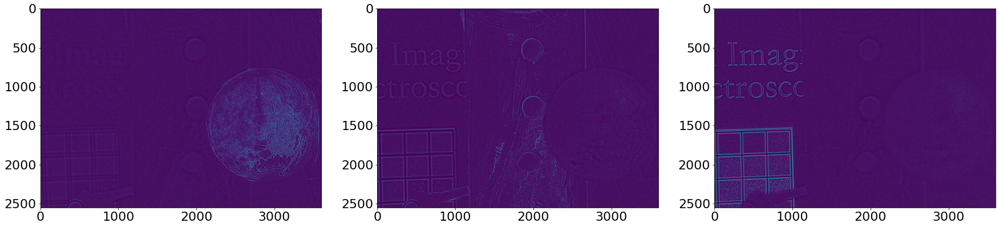

In [109]:
gradFG=cv2.GaussianBlur(cv2.Laplacian(cv2.GaussianBlur(warpImageFG[200:2750,200:3800],(9,9),0),None,cv2.CV_64F, 5),(9,9),0)
grad0=cv2.GaussianBlur(cv2.Laplacian(cv2.GaussianBlur(grayImage0[200:2750,200:3800],(9,9),0),None,cv2.CV_64F, 5),(9,9),0)
gradBG=cv2.GaussianBlur(cv2.Laplacian(cv2.GaussianBlur(warpImageBG[200:2750,200:3800],(9,9),0),None,cv2.CV_64F, 5),(9,9),0)
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.imshow(gradFG)
plt.subplot(1,3,2)
plt.imshow(grad0)
plt.subplot(1,3,3)
plt.imshow(gradBG)

above we plot the laplacian of each image, showning the greater values in the rear, front and mid fields according to their focus state. Next we plot the combined images with the maximum laplacian selected from each. 

In [110]:
stackImage=np.stack((gradFG,grad0,gradBG))

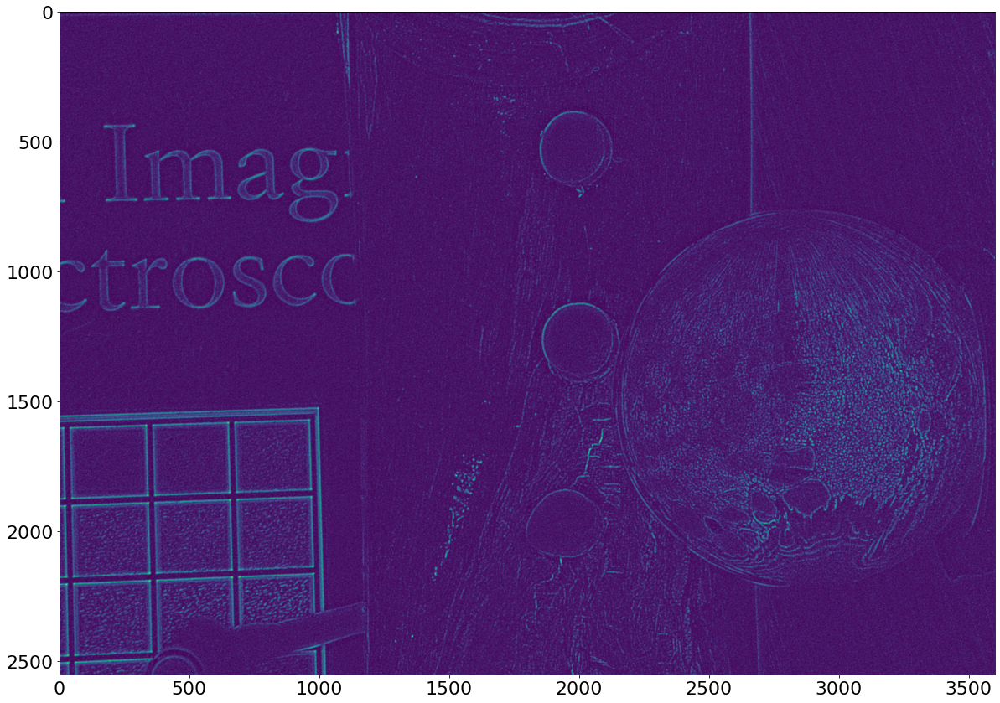

In [111]:
plt.imshow(np.maximum(np.maximum(gradFG,grad0),gradBG))

In [112]:
pop=np.argmax(np.abs(stackImage),axis=0)

here is a three level plot color coded to the focal region selected for each pixel

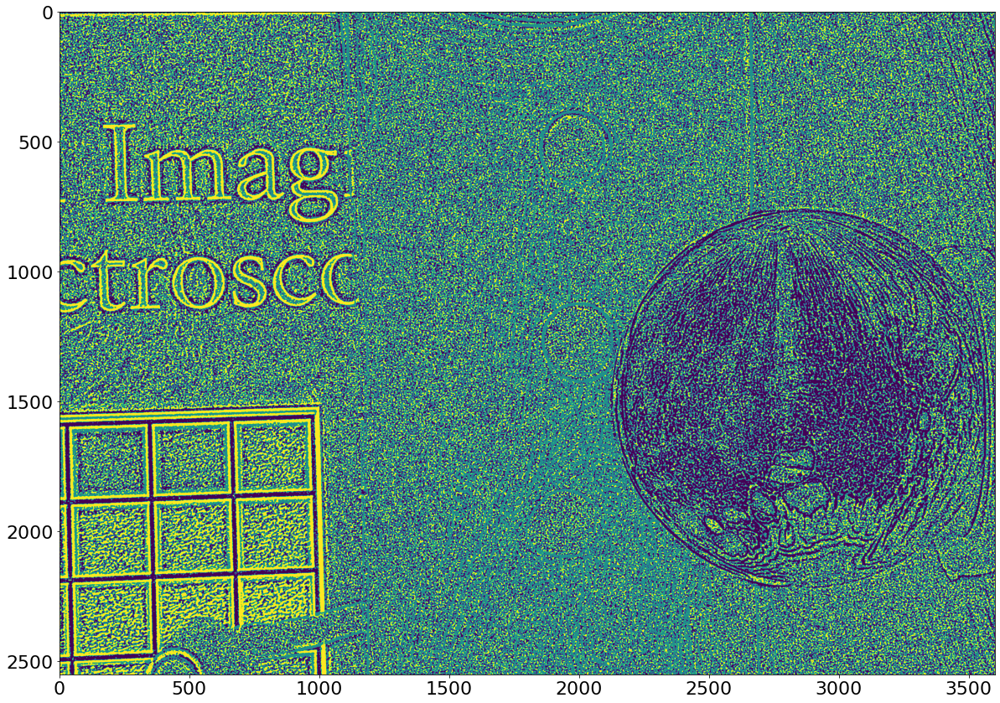

In [113]:
plt.imshow(pop)

Here we plot the assignment of the focal plane across a slice of the image. Note that despite our blur, it changes rapidly. 

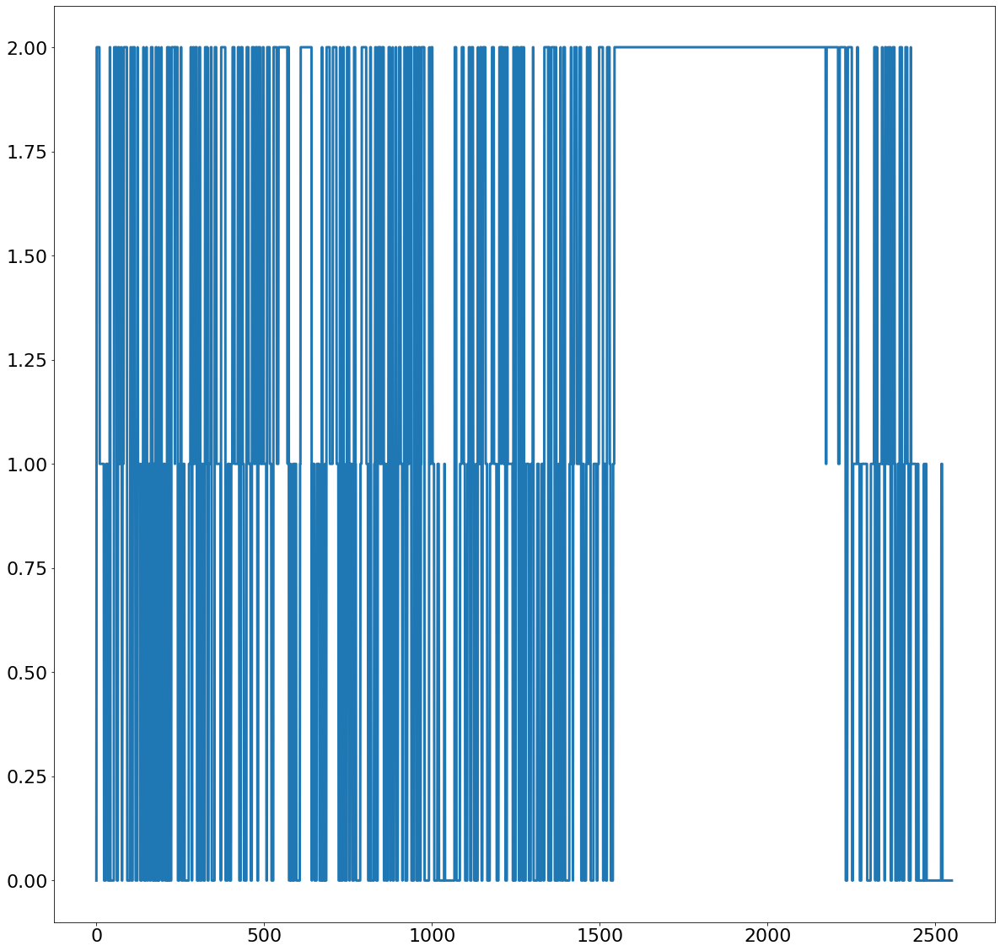

In [114]:
plt.plot(pop[:,1000])

In [116]:
gStack=np.stack((warpImageFG[200:2750,200:3800],grayImage0[200:2750,200:3800],warpImageBG[200:2750,200:3800]))

In [117]:
imI=np.zeros(pop.shape)
for pip in np.arange(pop.shape[0]):
  for pap in np.arange(pop.shape[1]):
    imI[pip,pap]=gStack[pop[pip,pap],pip,pap]

here is an all  in focus gray scale 

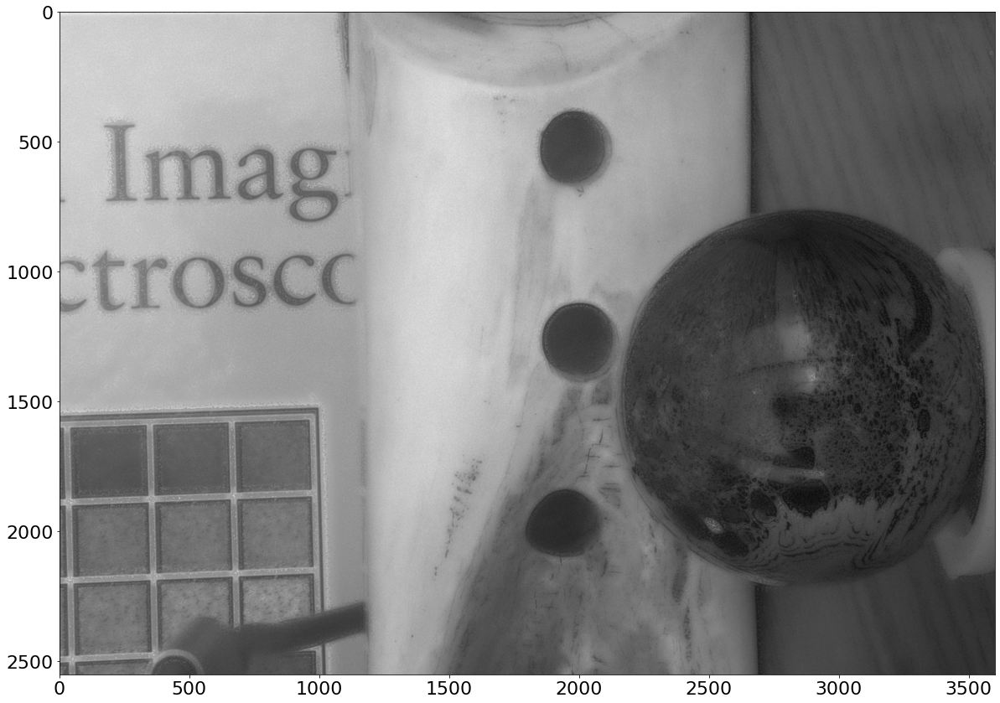

In [118]:
plt.imshow(imI, cmap='gray')

next we use the focus map to stack the color images.

In [119]:
CwarpImageFG=cv2.warpPerspective(np.flip(images[2],axis=-1),homographyFG,(4000,3000))[200:2750,200:3800]
CwarpImageBG=cv2.warpPerspective(np.flip(images[1],axis=-1),homographyBG,(4000,3000))[200:2750,200:3800]
midImage=np.flip(images[0],axis=-1)[200:2750,200:3800]

In [120]:
imI=np.zeros(midImage.shape).astype('uint8')
for pip in np.arange(pop.shape[0]):
  for pap in np.arange(pop.shape[1]):
    if pop[pip,pap]==0:
      imI[pip,pap,:]=CwarpImageFG[pip,pap,:]
    elif pop[pip,pap]==1:
      imI[pip,pap,:]=midImage[pip,pap,:]
    elif pop[pip,pap]==2:
      imI[pip,pap,:]=CwarpImageBG[pip,pap,:]

Text(0.5, 0, 'all in focus')

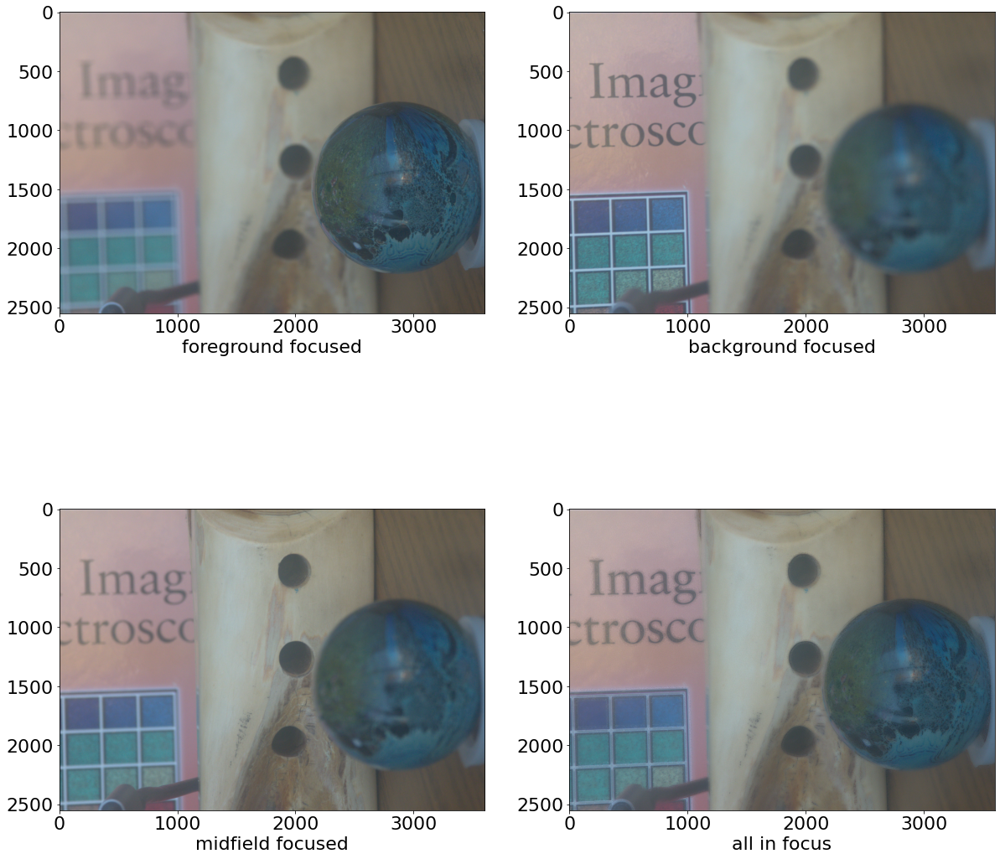

In [121]:
plt.subplot(2,2,1)
plt.imshow(CwarpImageFG)
plt.xlabel('foreground focused')
plt.subplot(2,2,2)
plt.imshow(CwarpImageBG)
plt.xlabel('background focused')
plt.subplot(2,2,3)
plt.imshow(midImage)
plt.xlabel('midfield focused')
plt.subplot(2,2,4)
plt.imshow(imI)
plt.xlabel('all in focus')